In [63]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline
import seaborn as sns
import math

Attribute Information:

1) ID number 
2) Diagnosis (M = malignant, B = benign) 
3-32) 

Ten real-valued features are computed for each cell nucleus: 

a) radius (mean of distances from center to points on the perimeter) 
b) texture (standard deviation of gray-scale values) 
c) perimeter 
d) area 
e) smoothness (local variation in radius lengths) 
f) compactness (perimeter^2 / area - 1.0) 
g) concavity (severity of concave portions of the contour) 
h) concave points (number of concave portions of the contour) 
i) symmetry 
j) fractal dimension ("coastline approximation" - 1)



In [64]:
data_frame = pd.read_csv('data_breast.csv')
data_frame.head()

,id,diagnosis,radius_mean,texture_mean,perimeter_mean,area_mean,smoothness_mean,compactness_mean,concavity_mean,concave points_mean,...,texture_worst,perimeter_worst,area_worst,smoothness_worst,compactness_worst,concavity_worst,concave points_worst,symmetry_worst,fractal_dimension_worst,Unnamed: 32
0,842302,M,17.99,10.38,122.80,1001.0,0.11840,0.27760,0.3001,0.14710,...,17.33,184.60,2019.0,0.1622,0.6656,0.7119,0.2654,0.4601,0.11890,NaN
1,842517,M,20.57,17.77,132.90,1326.0,0.08474,0.07864,0.0869,0.07017,...,23.41,158.80,1956.0,0.1238,0.1866,0.2416,0.1860,0.2750,0.08902,NaN
2,84300903,M,19.69,21.25,130.00,1203.0,0.10960,0.15990,0.1974,0.12790,...,25.53,152.50,1709.0,0.1444,0.4245,0.4504,0.2430,0.3613,0.08758,NaN
3,84348301,M,11.42,20.38,77.58,386.1,0.14250,0.28390,0.2414,0.10520,...,26.50,98.87,567.7,0.2098,0.8663,0.6869,0.2575,0.6638,0.17300,NaN
4,84358402,M,20.29,14.34,135.10,1297.0,0.10030,0.13280,0.1980,0.10430,...,16.67,152.20,1575.0,0.1374,0.2050,0.4000,0.1625,0.2364,0.07678,NaN


In [65]:
data_frame.describe()

,id,radius_mean,texture_mean,perimeter_mean,area_mean,smoothness_mean,compactness_mean,concavity_mean,concave points_mean,symmetry_mean,...,texture_worst,perimeter_worst,area_worst,smoothness_worst,compactness_worst,concavity_worst,concave points_worst,symmetry_worst,fractal_dimension_worst,Unnamed: 32
count,5.690000e+02,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,...,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,0.0
mean,3.037183e+07,14.127292,19.289649,91.969033,654.889104,0.096360,0.104341,0.088799,0.048919,0.181162,...,25.677223,107.261213,880.583128,0.132369,0.254265,0.272188,0.114606,0.290076,0.083946,NaN
std,1.250206e+08,3.524049,4.301036,24.298981,351.914129,0.014064,0.052813,0.079720,0.038803,0.027414,...,6.146258,33.602542,569.356993,0.022832,0.157336,0.208624,0.065732,0.061867,0.018061,NaN
min,8.670000e+03,6.981000,9.710000,43.790000,143.500000,0.052630,0.019380,0.000000,0.000000,0.106000,...,12.020000,50.410000,185.200000,0.071170,0.027290,0.000000,0.000000,0.156500,0.055040,NaN
25%,8.692180e+05,11.700000,16.170000,75.170000,420.300000,0.086370,0.064920,0.029560,0.020310,0.161900,...,21.080000,84.110000,515.300000,0.116600,0.147200,0.114500,0.064930,0.250400,0.071460,NaN
50%,9.060240e+05,13.370000,18.840000,86.240000,551.100000,0.095870,0.092630,0.061540,0.033500,0.179200,...,25.410000,97.660000,686.500000,0.131300,0.211900,0.226700,0.099930,0.282200,0.080040,NaN
75%,8.813129e+06,15.780000,21.800000,104.100000,782.700000,0.105300,0.130400,0.130700,0.074000,0.195700,...,29.720000,125.400000,1084.000000,0.146000,0.339100,0.382900,0.161400,0.317900,0.092080,NaN
max,9.113205e+08,28.110000,39.280000,188.500000,2501.000000,0.163400,0.345400,0.426800,0.201200,0.304000,...,49.540000,251.200000,4254.000000,0.222600,1.058000,1.252000,0.291000,0.663800,0.207500,NaN


In [66]:
data_frame.diagnosis.value_counts()/data_frame.diagnosis.count()*100

B    62.741652
M    37.258348
Name: diagnosis, dtype: float64

In [ ]:
# 63 процента приходятся на диагноз B и 37 на диагноз М

In [67]:
data_frame.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 569 entries, 0 to 568
Data columns (total 33 columns):
id                         569 non-null int64
diagnosis                  569 non-null object
radius_mean                569 non-null float64
texture_mean               569 non-null float64
perimeter_mean             569 non-null float64
area_mean                  569 non-null float64
smoothness_mean            569 non-null float64
compactness_mean           569 non-null float64
concavity_mean             569 non-null float64
concave points_mean        569 non-null float64
symmetry_mean              569 non-null float64
fractal_dimension_mean     569 non-null float64
radius_se                  569 non-null float64
texture_se                 569 non-null float64
perimeter_se               569 non-null float64
area_se                    569 non-null float64
smoothness_se              569 non-null float64
compactness_se             569 non-null float64
concavity_se               569 non

In [ ]:
# Unnamed - не содержит значений и не несет никакой информации. Целесообразно ее удалить. Также можно удалить колонку ID.

In [68]:
data_frame=data_frame.drop(['id'], axis=1)
data_frame=data_frame.drop(['Unnamed: 32'], axis=1)
data_frame.head()

,diagnosis,radius_mean,texture_mean,perimeter_mean,area_mean,smoothness_mean,compactness_mean,concavity_mean,concave points_mean,symmetry_mean,...,radius_worst,texture_worst,perimeter_worst,area_worst,smoothness_worst,compactness_worst,concavity_worst,concave points_worst,symmetry_worst,fractal_dimension_worst
0,M,17.99,10.38,122.80,1001.0,0.11840,0.27760,0.3001,0.14710,0.2419,...,25.38,17.33,184.60,2019.0,0.1622,0.6656,0.7119,0.2654,0.4601,0.11890
1,M,20.57,17.77,132.90,1326.0,0.08474,0.07864,0.0869,0.07017,0.1812,...,24.99,23.41,158.80,1956.0,0.1238,0.1866,0.2416,0.1860,0.2750,0.08902
2,M,19.69,21.25,130.00,1203.0,0.10960,0.15990,0.1974,0.12790,0.2069,...,23.57,25.53,152.50,1709.0,0.1444,0.4245,0.4504,0.2430,0.3613,0.08758
3,M,11.42,20.38,77.58,386.1,0.14250,0.28390,0.2414,0.10520,0.2597,...,14.91,26.50,98.87,567.7,0.2098,0.8663,0.6869,0.2575,0.6638,0.17300
4,M,20.29,14.34,135.10,1297.0,0.10030,0.13280,0.1980,0.10430,0.1809,...,22.54,16.67,152.20,1575.0,0.1374,0.2050,0.4000,0.1625,0.2364,0.07678


In [70]:
#Переодим  diagnosis в 1 и 0
data_frame.diagnosis.replace('M', 1,inplace=True)
data_frame.diagnosis.replace('B', 0,inplace=True)
data_frame.head()

,diagnosis,radius_mean,texture_mean,perimeter_mean,area_mean,smoothness_mean,compactness_mean,concavity_mean,concave points_mean,symmetry_mean,...,radius_worst,texture_worst,perimeter_worst,area_worst,smoothness_worst,compactness_worst,concavity_worst,concave points_worst,symmetry_worst,fractal_dimension_worst
0,1,17.99,10.38,122.80,1001.0,0.11840,0.27760,0.3001,0.14710,0.2419,...,25.38,17.33,184.60,2019.0,0.1622,0.6656,0.7119,0.2654,0.4601,0.11890
1,1,20.57,17.77,132.90,1326.0,0.08474,0.07864,0.0869,0.07017,0.1812,...,24.99,23.41,158.80,1956.0,0.1238,0.1866,0.2416,0.1860,0.2750,0.08902
2,1,19.69,21.25,130.00,1203.0,0.10960,0.15990,0.1974,0.12790,0.2069,...,23.57,25.53,152.50,1709.0,0.1444,0.4245,0.4504,0.2430,0.3613,0.08758
3,1,11.42,20.38,77.58,386.1,0.14250,0.28390,0.2414,0.10520,0.2597,...,14.91,26.50,98.87,567.7,0.2098,0.8663,0.6869,0.2575,0.6638,0.17300
4,1,20.29,14.34,135.10,1297.0,0.10030,0.13280,0.1980,0.10430,0.1809,...,22.54,16.67,152.20,1575.0,0.1374,0.2050,0.4000,0.1625,0.2364,0.07678


In [ ]:
#Теперь когда данные приведены в порядок, можно построить матрицу кореляции

In [71]:
correlation_matrix = data_frame.corr(method ='pearson').round(2)
correlation_matrix

,diagnosis,radius_mean,texture_mean,perimeter_mean,area_mean,smoothness_mean,compactness_mean,concavity_mean,concave points_mean,symmetry_mean,...,radius_worst,texture_worst,perimeter_worst,area_worst,smoothness_worst,compactness_worst,concavity_worst,concave points_worst,symmetry_worst,fractal_dimension_worst
diagnosis,1.00,0.73,0.42,0.74,0.71,0.36,0.60,0.70,0.78,0.33,...,0.78,0.46,0.78,0.73,0.42,0.59,0.66,0.79,0.42,0.32
radius_mean,0.73,1.00,0.32,1.00,0.99,0.17,0.51,0.68,0.82,0.15,...,0.97,0.30,0.97,0.94,0.12,0.41,0.53,0.74,0.16,0.01
texture_mean,0.42,0.32,1.00,0.33,0.32,-0.02,0.24,0.30,0.29,0.07,...,0.35,0.91,0.36,0.34,0.08,0.28,0.30,0.30,0.11,0.12
perimeter_mean,0.74,1.00,0.33,1.00,0.99,0.21,0.56,0.72,0.85,0.18,...,0.97,0.30,0.97,0.94,0.15,0.46,0.56,0.77,0.19,0.05
area_mean,0.71,0.99,0.32,0.99,1.00,0.18,0.50,0.69,0.82,0.15,...,0.96,0.29,0.96,0.96,0.12,0.39,0.51,0.72,0.14,0.00
smoothness_mean,0.36,0.17,-0.02,0.21,0.18,1.00,0.66,0.52,0.55,0.56,...,0.21,0.04,0.24,0.21,0.81,0.47,0.43,0.50,0.39,0.50
compactness_mean,0.60,0.51,0.24,0.56,0.50,0.66,1.00,0.88,0.83,0.60,...,0.54,0.25,0.59,0.51,0.57,0.87,0.82,0.82,0.51,0.69
concavity_mean,0.70,0.68,0.30,0.72,0.69,0.52,0.88,1.00,0.92,0.50,...,0.69,0.30,0.73,0.68,0.45,0.75,0.88,0.86,0.41,0.51
concave points_mean,0.78,0.82,0.29,0.85,0.82,0.55,0.83,0.92,1.00,0.46,...,0.83,0.29,0.86,0.81,0.45,0.67,0.75,0.91,0.38,0.37
symmetry_mean,0.33,0.15,0.07,0.18,0.15,0.56,0.60,0.50,0.46,1.00,...,0.19,0.09,0.22,0.18,0.43,0.47,0.43,0.43,0.70,0.44


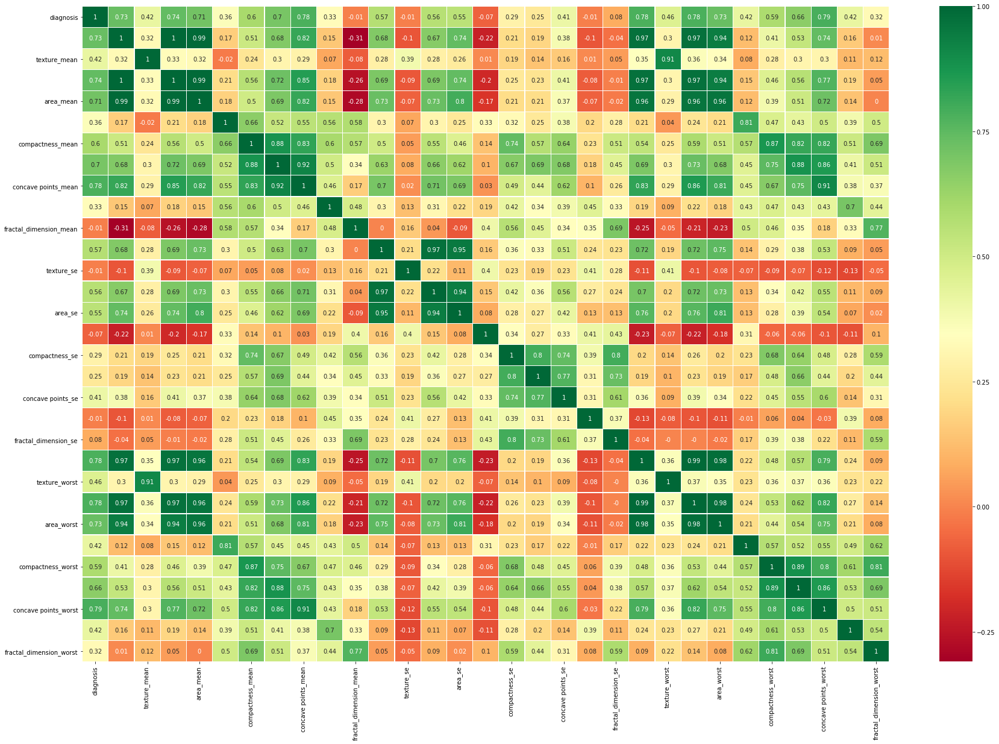

In [74]:
sns.heatmap(correlation_matrix,annot=True,cmap='RdYlGn',linewidths=0.3)
fig=plt.gcf()
fig.set_size_inches(30,20)
plt.show()

/Users/erik/anaconda3/lib/python3.7/site-packages/scipy/stats/stats.py:1713: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  return np.add.reduce(sorted[indexer] * weights, axis=axis) / sumval
/Users/erik/anaconda3/lib/python3.7/site-packages/statsmodels/nonparametric/kde.py:488: RuntimeWarning: invalid value encountered in true_divide
  binned = fast_linbin(X, a, b, gridsize) / (delta * nobs)
/Users/erik/anaconda3/lib/python3.7/site-packages/statsmodels/nonparametric/kdetools.py:34: RuntimeWarning: invalid value encountered in double_scalars
  FAC1 = 2*(np.pi*bw/RANGE)**2
/Users/erik/anaconda3/lib/python3.7/site-packages/numpy/core/fromnumeric.py:83: RuntimeWarning: invalid value encountered in reduce
  return ufunc.reduce(obj, axis, dtype, out, **passkwargs)


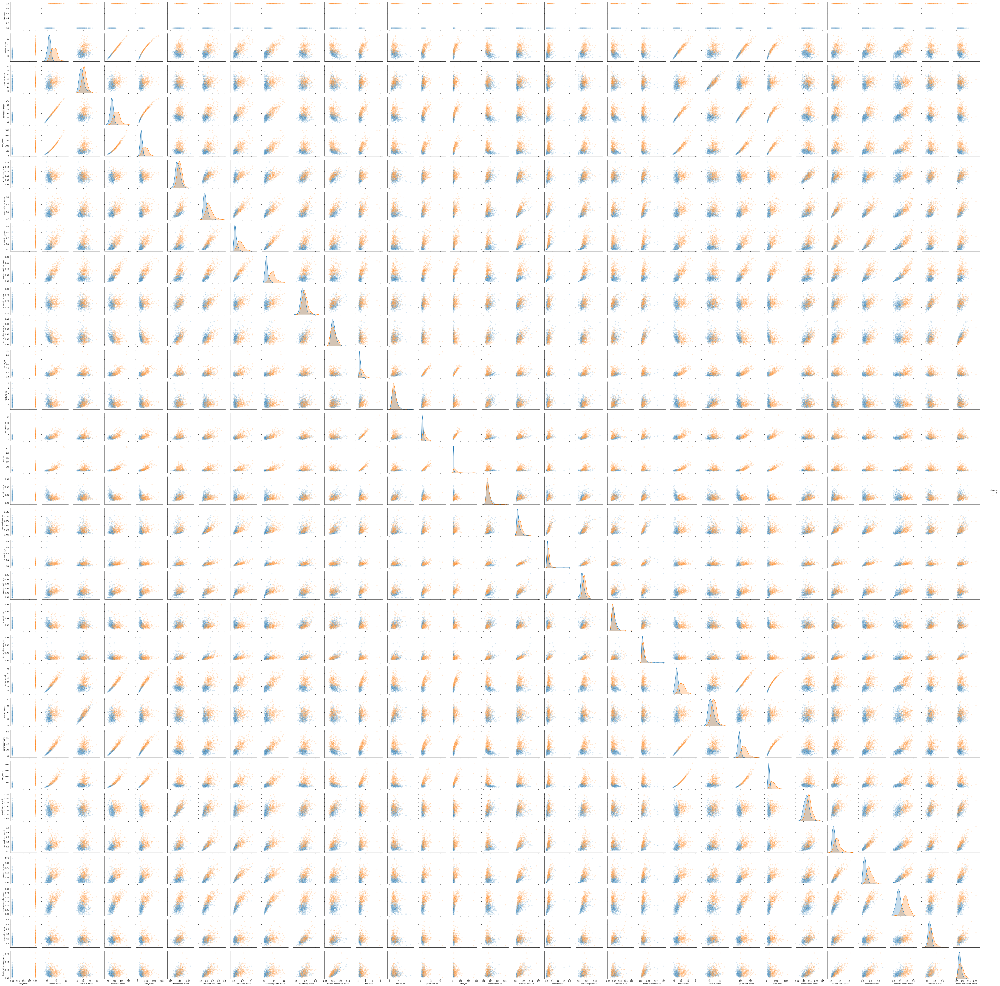

In [76]:
graph = sns.pairplot(data=data_frame ,plot_kws={'alpha':0.2},hue='diagnosis')

In [ ]:
#Выберем данные с наибольшей корреляцией и для наглядности построим такой же pairplot для них

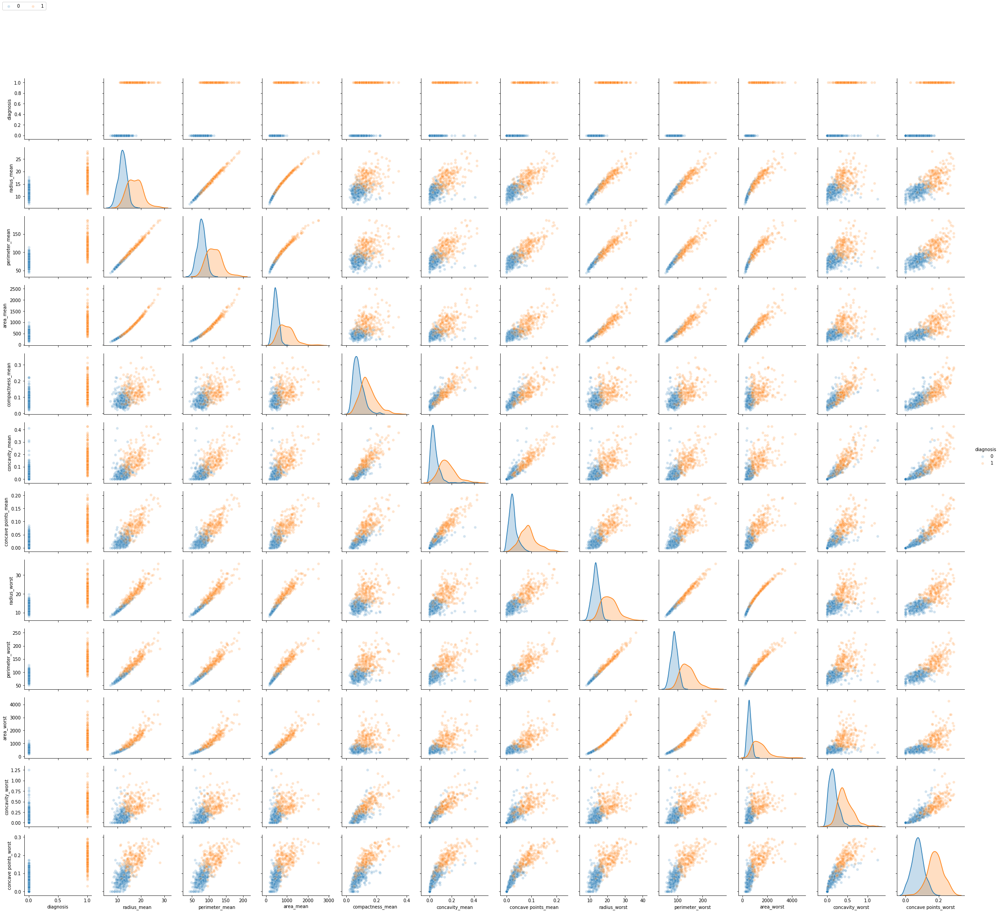

In [78]:
data_frame_filtered=data_frame[['diagnosis','radius_mean', 'perimeter_mean', 'area_mean', 'compactness_mean', 'concavity_mean',\
            'concave points_mean','radius_worst','perimeter_worst','area_worst','concavity_worst','concave points_worst']]

g=sns.pairplot(data=data_frame_filtered,plot_kws={'alpha':0.2},hue='diagnosis')
handles = g._legend_data.values()
labels = g._legend_data.keys()
g.fig.legend(handles=handles, labels=labels, loc='upper left', ncol=2)
g.fig.subplots_adjust(top=0.92, bottom=0.08)

In [ ]:
# Можем сделать вывод что отличатся средние значения для доброкачественных и злокачетсвенных клеток. Также видим что дисперсия 
# доброкачественных значительно меньше

In [79]:
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LogisticRegression
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import accuracy_score, classification_report
from sklearn.preprocessing import Normalizer
from sklearn.feature_selection import RFECV

In [86]:
#Dividing on  test (20%) and train (80%) data
X_train, X_test, y_train, y_test = train_test_split(data_frame.iloc[:,1:], data_frame['diagnosis'], train_size = 0.8 )

In [89]:
# приводим наши датафрэймы в нормальизованный вид
norm = Normalizer()
norm.fit(X_train)
X_train_norm = norm.transform(X_train)
X_test_norm = norm.transform(X_test)

X_train_norm
X_test_norm

array([[2.61835034e-02, 8.66088059e-02, 1.64570349e-01, ...,
        1.70221710e-04, 9.49837140e-04, 3.62912685e-04],
       [1.48503383e-02, 2.34395750e-02, 9.71713915e-02, ...,
        1.33472218e-04, 2.89660708e-04, 9.23795015e-05],
       [1.36425885e-02, 1.56098893e-02, 8.93984984e-02, ...,
        1.36722463e-04, 2.55946823e-04, 1.01825117e-04],
       ...,
       [9.43389055e-03, 8.44084944e-03, 6.28229166e-02, ...,
        1.09861706e-04, 1.96047221e-04, 5.79099764e-05],
       [8.90100828e-03, 1.22267612e-02, 5.90783061e-02, ...,
        8.24509589e-05, 1.69613401e-04, 5.18725080e-05],
       [1.23147260e-02, 1.42306750e-02, 7.92705639e-02, ...,
        6.16906344e-05, 1.84794018e-04, 4.36719380e-05]])

In [92]:
#Используем логистическую регрессию и метод рекурсивного исключения признаков для отбора переменных:

model_log_reg_sel = LogisticRegression(solver = 'liblinear')


# Выбор наиболее значимых переменных / обучение модели
selector = RFECV(model_log_reg_sel, cv = 5, scoring='accuracy')
selector.fit(X_train_norm, y_train)

RFECV(cv=5,
   estimator=LogisticRegression(C=1.0, class_weight=None, dual=False, fit_intercept=True,
          intercept_scaling=1, max_iter=100, multi_class='warn',
          n_jobs=None, penalty='l2', random_state=None, solver='liblinear',
          tol=0.0001, verbose=0, warm_start=False),
   min_features_to_select=1, n_jobs=None, scoring='accuracy', step=1,
   verbose=0)

In [94]:
#наиболее важные переменные
[i for i in list(X_train.columns[selector.support_])]

['radius_mean',
 'texture_mean',
 'perimeter_mean',
 'area_mean',
 'area_se',
 'radius_worst',
 'texture_worst',
 'perimeter_worst',
 'area_worst']

In [95]:
selector.set_params

<bound method BaseEstimator.set_params of RFECV(cv=5,
   estimator=LogisticRegression(C=1.0, class_weight=None, dual=False, fit_intercept=True,
          intercept_scaling=1, max_iter=100, multi_class='warn',
          n_jobs=None, penalty='l2', random_state=None, solver='liblinear',
          tol=0.0001, verbose=0, warm_start=False),
   min_features_to_select=1, n_jobs=None, scoring='accuracy', step=1,
   verbose=0)>

In [101]:
y_pred_proba=selector.predict_proba(X_test_norm)
y_pred=selector.predict(X_test_norm)
for i in zip(y_pred_proba[:,1], y_pred,y_test):
    print(i)

(0.24911963854186003, 0, 0)
(0.36085856230271796, 0, 0)
(0.4272523438325354, 0, 1)
(0.4003656646017054, 0, 1)
(0.2961347975906693, 0, 0)
(0.36892898306172006, 0, 0)
(0.4588382678103394, 0, 1)
(0.2828542854623989, 0, 0)
(0.3209698477198656, 0, 0)
(0.5343500975095943, 1, 1)
(0.4669660710504646, 0, 1)
(0.23280835510682943, 0, 0)
(0.29968929243607667, 0, 0)
(0.4327120666975746, 0, 1)
(0.29204015336431655, 0, 0)
(0.4507400537015816, 0, 1)
(0.2467305866675896, 0, 0)
(0.3759590560419591, 0, 0)
(0.3196366233223872, 0, 1)
(0.2567806982760286, 0, 0)
(0.2643748502516303, 0, 0)
(0.34930458210604615, 0, 0)
(0.30435350082005297, 0, 0)
(0.3427518717206281, 0, 0)
(0.48529624718553493, 0, 1)
(0.3465302586594639, 0, 0)
(0.32715101007434655, 0, 0)
(0.4297266040265967, 0, 1)
(0.21476118126725383, 0, 0)
(0.24897335993807065, 0, 0)
(0.29162289015910375, 0, 0)
(0.47469090624280214, 0, 1)
(0.35963351055792625, 0, 0)
(0.2811751394895618, 0, 0)
(0.575159922843898, 1, 1)
(0.4523085490729976, 0, 1)
(0.68535007677

In [102]:
score_train = selector.score(X_train_norm, y_train)
print(score_train)

0.7824175824175824


In [106]:
#accuracy with RFE:
score = selector.score(X_test_norm, y_test)
print(score)

0.7631578947368421


In [109]:
#качество классификации
print(classification_report(y_test,y_pred))

              precision    recall  f1-score   support

           0       0.72      1.00      0.84        71
           1       1.00      0.37      0.54        43

   micro avg       0.76      0.76      0.76       114
   macro avg       0.86      0.69      0.69       114
weighted avg       0.83      0.76      0.73       114



In [ ]:
#доброкачественные опухоли прогнозируются положительно на  100% - но 28% ложноположительно
#злокачественные прогнозируются положительно на 37% - и все в точку

In [ ]:
# Построим модель с помощью Random Forest Classifier

In [112]:
cols = list(filter(lambda x: x in X_test.columns, X_train.columns))

clf = RandomForestClassifier(n_estimators=100, max_depth=30, random_state=0)\
.fit(X_train_norm, y_train)

In [113]:
from sklearn.metrics import roc_auc_score

In [114]:
y_RFC_train_predict = clf.predict(X_train_norm)


roc_auc_train = np.round(roc_auc_score(y_train, y_RFC_train_predict), 2)
print("Train: ", roc_auc_train)

Train:  1.0


In [115]:
y_RFC_test_predict = clf.predict(X_test_norm)


roc_auc_test = np.round(roc_auc_score(y_test, y_RFC_test_predict), 2)
print("Test: ", roc_auc_test)

Test:  0.93


In [116]:
accuracy_score(y_test, y_RFC_test_predict)

0.9473684210526315

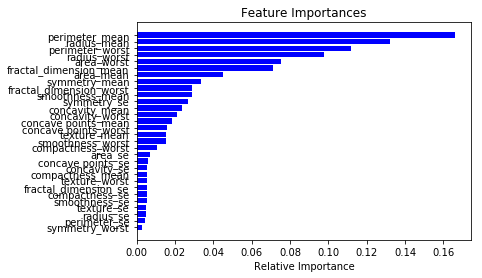

In [117]:
features = X_train.columns
importances = clf.feature_importances_

indices = np.argsort(importances)

plt.title('Feature Importances')
plt.barh(range(len(indices)), importances[indices], color='b', align='center')
plt.yticks(range(len(indices)), [features[i] for i in indices])
plt.xlabel('Relative Importance')
plt.show()

In [119]:
#качество классификации
print(classification_report(y_test,y_RFC_test_predict))

              precision    recall  f1-score   support

           0       0.93      0.99      0.96        71
           1       0.97      0.88      0.93        43

   micro avg       0.95      0.95      0.95       114
   macro avg       0.95      0.93      0.94       114
weighted avg       0.95      0.95      0.95       114



In [121]:
#результаты гораздо лучше

#доброкачественные опухоли прогнозируются положительно на  99% - и 7% ложноположительно
#злокачественные прогнозируются положительно на 88% - и лишь 3% ложноположительно